## Depencies

In [2]:
%pip install numpy
%pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 7.9 MB/s eta 0:00:00m eta 0:00:010:01:01

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
  Using cached contourpy-1.3.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.4 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached kiwisolver-1.4.7-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.3 kB)
  Using cached pillow-11.0.0-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (9.1 kB)
  Using cached pyparsing-3.2.0-py3-none-any.whl.metadata (5.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 9.3 MB/s eta 0:00:00 MB/s eta 0:00:01:01
Using cached contourpy-1.3.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (323 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9

In [3]:
from math import *
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

## 2D Leg model, Forward Kinematics

In this section, we neglect the motion in the z direction and only consider the motion in the x-y plane.

units: cm, rad

In [47]:
# Geometry method

# Link lengths
L0 = 8.16
L1 = 8.0
L2 = 10.0
L3 = 8.0
L4 = 13.0
L5 = 8.0

# Motor positions
p0 = np.array([0, 0])
p5 = np.array([L0, 0])

def get_position(thetaA, thetaB):
  p1 = np.array([L1*cos(thetaA), -L1*sin(thetaA)])
  p4 = np.array([L5*cos(thetaB)+L0, -L5*sin(thetaB)])
  L14 = np.linalg.norm(p4-p1)

  if(L4 > L14 + L2):
    print("Unreachable")
    return None
  elif (L4 == L14 + L2):
    print("Singularity")
  
  theta_214 = acos((L2**2 + L14**2 - L4**2) / (2*L2*L14))
  rotation_matrix1 = np.array([[np.cos(theta_214), -np.sin(theta_214)],
                              [np.sin(theta_214), np.cos(theta_214)]])
  rotation_matrix2 = np.array([[np.cos(-theta_214), -np.sin(-theta_214)],
                              [np.sin(-theta_214), np.cos(-theta_214)]])

  unit_vector_14 = (p4 - p1)/L14
  p2_1 = p1 + L2 * rotation_matrix1 @ unit_vector_14
  p2_2 = p1 + L2 * rotation_matrix2 @ unit_vector_14

  p2 = p2_1 if p2_1[1] < p2_2[1] else p2_2
  p3 = p2 + (p2 - p1)/np.linalg.norm(p2 - p1) * L3

  return p1, p2, p3, p4


Visualize the 2D leg model:

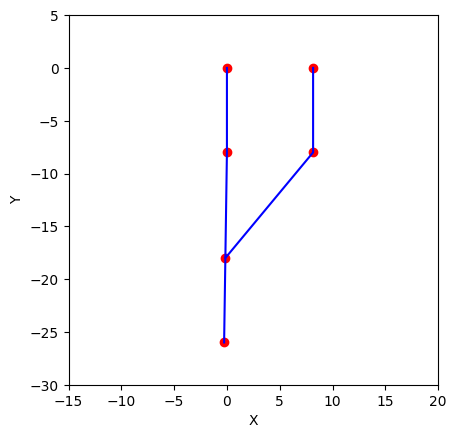

In [73]:
thetaA = np.pi/2
thetaB = np.pi/2
p1, p2, p3, p4 = get_position(thetaA, thetaB)
points = np.array([p0, p1, p2, p3, p4, p5])
fig = plt.figure()
ax = fig.add_subplot()

ax.scatter(points[:, 0], points[:, 1], color='r')

# Connect the points with lines
# p0 -> p1 -> p2 -> p4 -> p5
# p2 -> p3
ax.plot(points[[0, 1, 2, 4, 5], 0], points[[0, 1, 2, 4, 5], 1], color='b')
ax.plot(points[[2, 3], 0], points[[2, 3], 1], color='b')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim([-15, 20])
ax.set_ylim([-30, 5])
ax.set_aspect('equal')
plt.show()

Animation

In [75]:
# fig = plt.figure()
ax = fig.add_subplot(111)

# Initialize the points and lines
points = np.zeros((6, 2))  # 6 points in 2D
scat = ax.scatter(points[:, 0], points[:, 1], color='r')
line1, = ax.plot([], [], color='b') # Line p0 -> p1 -> p2 -> p4 -> p5
line2, = ax.plot([], [], color='b') # Line p2 -> p3

# Update function for animation
thetaA_val = np.linspace(np.pi, np.pi/2, 200)
thetaB_val = np.linspace(np.pi/2, 0, 200)

def update(frame):
  thetaA = thetaA_val[frame]
  thetaB = thetaB_val[frame]
  p1, p2, p3, p4 = get_position(thetaA, thetaB)
  points[:6] = np.array([p0, p1, p2, p3, p4, p5])  # Update points

  # Update scatter plot
  scat.set_offsets(points)

  # Update lines
  line1.set_data(points[[0, 1, 2, 3], 0], points[[0, 1, 2, 3], 1])
  line2.set_data(points[[0, 1, 2, 4, 5], 0], points[[0, 1, 2, 4, 5], 1])

  return scat, line1, line2

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim([-15, 20])
ax.set_ylim([-30, 5])
ax.set_aspect('equal')

ani = FuncAnimation(fig, update, frames=200, interval=20, blit=True)
HTML(ani.to_jshtml())

## Denavit-Hartenberg(DH) method

$ a_i $: distance between $ O_{i-1} $ and $ O_i $ measured along $ x_{i-1} $  
$ d_i $: distance between $ O_{i-1} $ and $ O_i $ measured along $ z_{i-1} $  
$ \alpha_i $: angle between $ z_{i-1} $ and $ z_i $ measured about $ x_i $ when the rotation is made counterclockwise.  
$ \theta_i $: angle between $ x_{i-1} $ and $ x_i $ measured about $ z_{i-1} $ when the rotation is made counterclockwise.  

## Closed chain

1. Select one joint in the chain which is not actuated as cut open.
2. Obtain the open chain
3. Calculate the homogeneous transformation matrix for the open chain
4. Find equality constraints for two frames connected by the cut joint
5. Solve the constraints

## Reference

- [YT video - 2.13 D-H parameters of 4-bar parallel robot](https://www.youtube.com/watch?v=oIz5L0VpLQo&t=332s)
- [YT video - Introduction to DH Convention](https://www.youtube.com/watch?v=JSEPoyIypHQ)

In [202]:
# Denavit-Hartenberg(DH) method
class Leg:
  def __init__(self, angA=None, thetaB=None):
    self.L0 = 8.16
    self.L1 = 8.0
    self.L2 = 10.0
    self.L3 = 8.0
    self.L4 = 13.0
    self.L5 = 8.0
    self.thetaA = thetaA
    self.thetaB = thetaB
  
  def get_leg_state(self, thetaA, thetaB):
    p1 = np.array([self.L1*cos(thetaA), -self.L1*sin(thetaA)])
    p5 = np.array([self.L0, 0])
    p4 = np.array([self.L5*cos(thetaB), -self.L5*sin(thetaB)]) + p5
    self.L14 = np.linalg.norm(p4-p1)

    if(self.L4 > self.L14 + self.L2):
      print("Unreachable")
      return None
    elif (self.L4 == self.L14 + self.L2):
      print("Singularity")

    theta_214 = acos((self.L2**2 + self.L14**2 - self.L4**2) / (2 * self.L2 * self.L14))
    rotation_matrix1 = np.array([[np.cos(theta_214), -np.sin(theta_214)],
                                [np.sin(theta_214), np.cos(theta_214)]])
    rotation_matrix2 = np.array([[np.cos(-theta_214), -np.sin(-theta_214)],
                                [np.sin(-theta_214), np.cos(-theta_214)]])

    unit_vector_14 = (p4 - p1) / self.L14
    p2_1 = p1 + self.L2 * rotation_matrix1 @ unit_vector_14
    p2_2 = p1 + self.L2 * rotation_matrix2 @ unit_vector_14

    p2 = p2_1 if p2_1[1] < p2_2[1] else p2_2
    p3 = p2 + (p2 - p1)/np.linalg.norm(p2 - p1) * self.L3
    points = np.array([p0, p1, p2, p3, p4, p5])
    angles = np.array([
      thetaA,  # ang0
      acos((self.L2**2 + self.L1**2 - np.linalg.norm(p2-p0)**2) / (2 * self.L2 * self.L1)),  # ang1
      acos((self.L2**2 + self.L4**2 - self.L14**2) / (2 * self.L2 * self.L4)),  # ang2
      None, # ang3
      acos((self.L4**2 + self.L5**2 - np.linalg.norm(p2-p5)**2) / (2 * self.L4 * self.L5)),  # ang4
      np.pi - thetaB  # ang5
    ])

    return points, angles
  
  def update_leg_state(self, thetaA, thetaB):
    self.points, self.angles = self.get_leg_state(thetaA, thetaB)
    self.transform_matrix = self.get_transform_matrix(self.angles)

  def get_coordinate_transform(self,a, d, alpha, theta):
    return np.array([[np.cos(theta), -np.sin(theta)*np.cos(alpha), np.sin(theta)*np.sin(alpha), a*np.cos(theta)],
                     [np.sin(theta), np.cos(theta)*np.cos(alpha), -np.cos(theta)*np.sin(alpha), a*np.sin(theta)],
                     [0, np.sin(alpha), np.cos(alpha), d],
                     [0, 0, 0, 1]])
  
  def get_transform_matrix(self, angles):
    A0 = self.get_coordinate_transform(a=self.L0, d=0, alpha=0, theta=0) # base -> 0
    A1 = self.get_coordinate_transform(a=self.L1, d=0, alpha=0, theta=2*np.pi-angles[0]) # base -> 1
    A2 = self.get_coordinate_transform(a=self.L2, d=0, alpha=0, theta=np.pi-angles[1]) # 1 -> 2
    A3 = self.get_coordinate_transform(a=self.L3, d=0, alpha=0, theta=0) # 2 -> 3
    A4 = self.get_coordinate_transform(a=self.L4, d=0, alpha=0, theta=np.pi+angles[4]) # 5 -> 4
    A5 = self.get_coordinate_transform(a=self.L5, d=0, alpha=0, theta=np.pi+angles[5]) # 0 -> 5

    T1 = A1
    T2 = T1 @ A2
    T3 = T2 @ A3
    T5 = A0 @ A5
    T4 = T5 @ A4

    return [T1, T2, T3, T4, T5]
  
  def get_jacobian(self, angles, transform_matrix):
    J = np.zeros((6, 6))
    for i in range(6):
      if i == 3:
        continue
      z = transform_matrix[i][:3, 2]
      p = transform_matrix[i][:3, 3]
      J[:3, i] = np.cross(z, self.points[5] - p)
      J[3:, i] = z
    return J



In [203]:


# Initialize the points and lines
points = np.zeros((6, 2))  # 6 points in 2D
scat = ax.scatter(points[:, 0], points[:, 1], color='r')
line1, = ax.plot([], [], color='b') # Line p0 -> p1 -> p2 -> p4 -> p5
line2, = ax.plot([], [], color='b') # Line p2 -> p3

# Update function for animation
thetaA_val = np.linspace(np.pi, np.pi/2, 200)
thetaB_val = np.linspace(np.pi/2, 0, 200)

p1, p2, p3, p4 = get_position(thetaA_val[0], thetaB_val[0])
points = np.array([p0, p1, p2, p3, p4, p5])

print(p1, p2, p3, p4)
print('\n')

leg = Leg()
leg.update_leg_state(thetaA_val[0], thetaB_val[0])

[-8.00000000e+00 -9.79717439e-16] [-4.75777679 -9.45980913] [ -2.16399823 -17.02765643] [ 8.16 -8.  ]


[[-1.8369702e-16  1.0000000e+00  0.0000000e+00  8.1600000e+00]
 [-1.0000000e+00 -1.8369702e-16  0.0000000e+00 -8.0000000e+00]
 [ 0.0000000e+00  0.0000000e+00  1.0000000e+00  0.0000000e+00]
 [ 0.0000000e+00  0.0000000e+00  0.0000000e+00  1.0000000e+00]]


## Set up 3D demonstration

In [17]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

def gen(n):
    phi = 0
    while phi < 2*np.pi:
        yield np.array([np.cos(phi), np.sin(phi), phi])
        phi += 2*np.pi/n

def update(num, data, line):
    line.set_data(data[:2, :num])
    line.set_3d_properties(data[2, :num])

N = 100
data = np.array(list(gen(N))).T
line, = ax.plot(data[0, 0:1], data[1, 0:1], data[2, 0:1])

# Setting the axes properties
ax.set_xlim3d([-1.0, 1.0])
ax.set_xlabel('X')

ax.set_ylim3d([-1.0, 1.0])
ax.set_ylabel('Y')

ax.set_zlim3d([0.0, 10.0])
ax.set_zlabel('Z')

ani = FuncAnimation(fig, update, N, fargs=(data, line), interval=10000/N, blit=False)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>